In [1]:
!pip install --upgrade pip
!pip install opencv-python

Requirement already up-to-date: pip in c:\users\sharif nasser\appdata\local\programs\python\python38-32\lib\site-packages (20.0.2)


In [33]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
# %matplotlib inline, widget, notebook

print(cv2.__version__)

4.2.0


In [34]:
img = cv2.imread('image.jpg', -1)
print(img.shape), print(img.size), print(img.dtype)

(1201, 1601, 3)
5768403
uint8


(None, None, None)

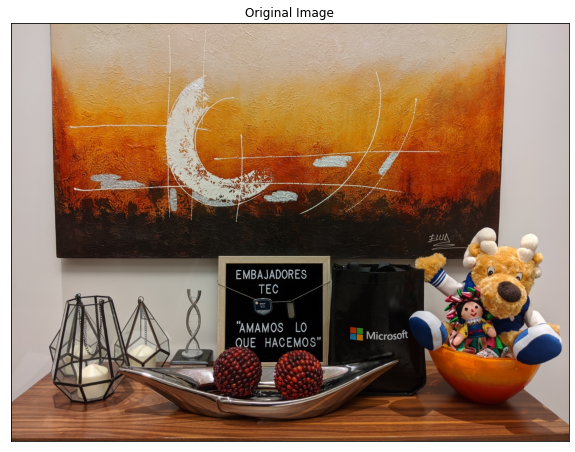

In [225]:
img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))
plt.title("Original Image")
plt.xticks([]), plt.yticks([])
plt.imsave("Original Image.png", img_)
plt.imshow(img_)

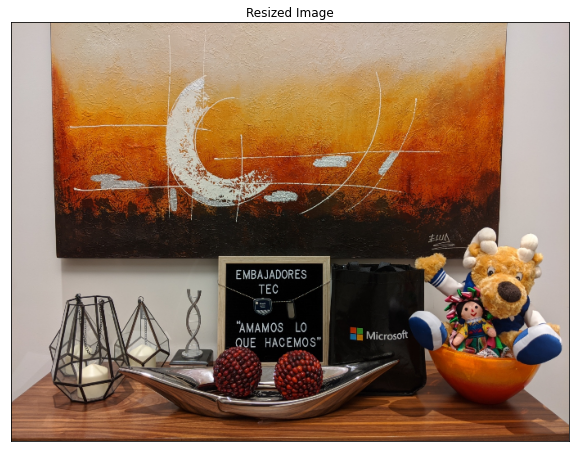

In [226]:
img_resized = cv2.resize(img, (682, 512))
img_ = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))
plt.title("Resized Image")
plt.xticks([]), plt.yticks([])
plt.imshow(img_)
plt.imsave("Resized Image.png", img_)

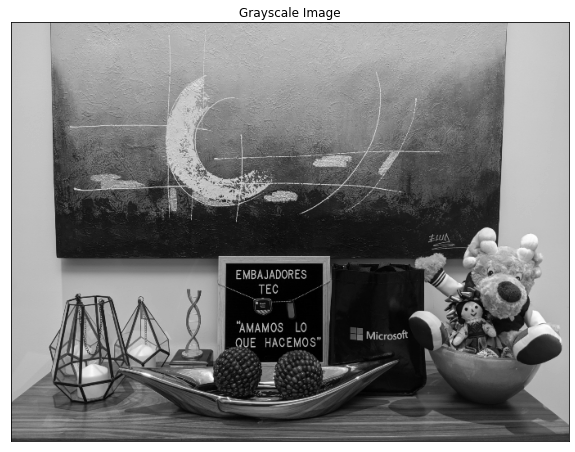

In [227]:
img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(10,10))
plt.title("Grayscale Image")
plt.xticks([]), plt.yticks([])
plt.imshow(img_gray, cmap='gray')
plt.imsave("Grayscale Image.png", img_gray, cmap='gray')

# Image Filtering

## Low Pass Filters

### Average Filter (Blur or Box Filter)

In [228]:
kernel_size = 5
kernel = np.ones((kernel_size, kernel_size),np.float32)/(kernel_size*kernel_size)
print(kernel)

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


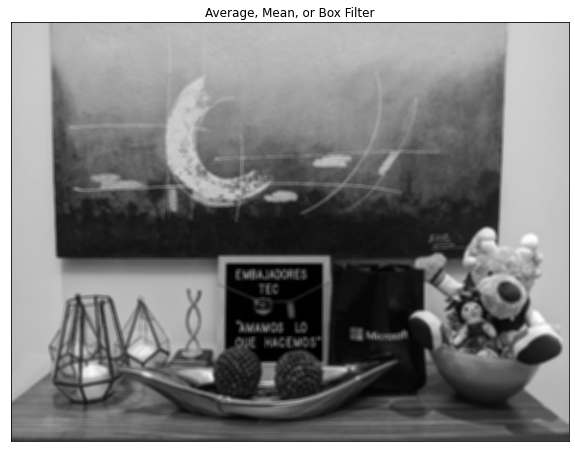

In [229]:
img_filtered = cv2.filter2D(src=img_gray, ddepth=-1, kernel=kernel)
plt.figure(figsize=(10,10))
plt.title("Average, Mean, or Box Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("Average Image.png", img_filtered, cmap='gray')

### Gaussian Filter

In [230]:
kernel = np.array([[1, 4, 7, 4, 1],
                [4, 16, 26, 16, 4],
                [7, 26, 41, 26, 7],
                [4, 16, 26, 16, 4],
                  [1, 4, 7, 4, 1]]) / 273

print(kernel)

[[0.003663   0.01465201 0.02564103 0.01465201 0.003663  ]
 [0.01465201 0.05860806 0.0952381  0.05860806 0.01465201]
 [0.02564103 0.0952381  0.15018315 0.0952381  0.02564103]
 [0.01465201 0.05860806 0.0952381  0.05860806 0.01465201]
 [0.003663   0.01465201 0.02564103 0.01465201 0.003663  ]]


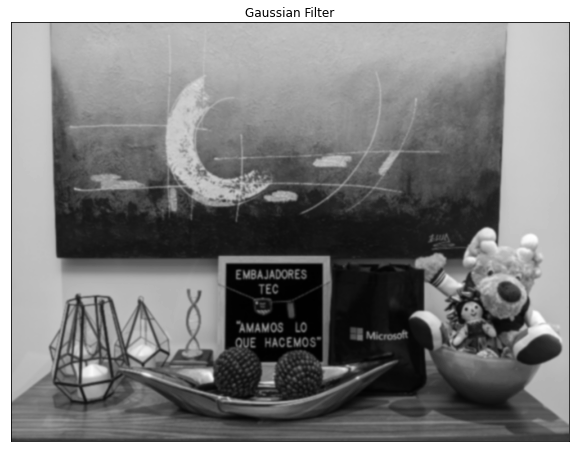

In [231]:
img_filtered = cv2.filter2D(src=img_gray, ddepth=-1, kernel=kernel)
plt.figure(figsize=(10,10))
plt.title("Gaussian Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("Gaussian Image.png", img_filtered, cmap='gray')

### Median Filter

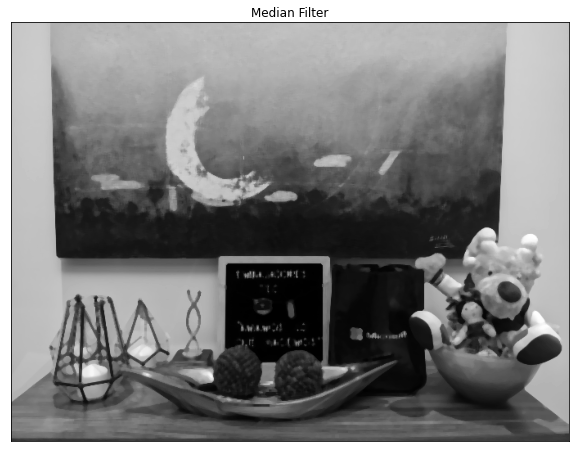

In [232]:
img_filtered = cv2.medianBlur(img_gray, ksize=5)
plt.figure(figsize=(10,10))
plt.title("Median Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("Median Image.png", img_filtered, cmap='gray')

## High Pass Filters

### Laplacian Filter

In [233]:
kernel = np.array([[-1, -1, -1, -1, -1],
                   [-1, -1, -1, -1, -1],
                   [-1, -1, 24, -1, -1],
                   [-1, -1, -1, -1, -1],
                   [-1, -1, -1, -1, -1]])

print(kernel)

[[-1 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1]
 [-1 -1 24 -1 -1]
 [-1 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1]]


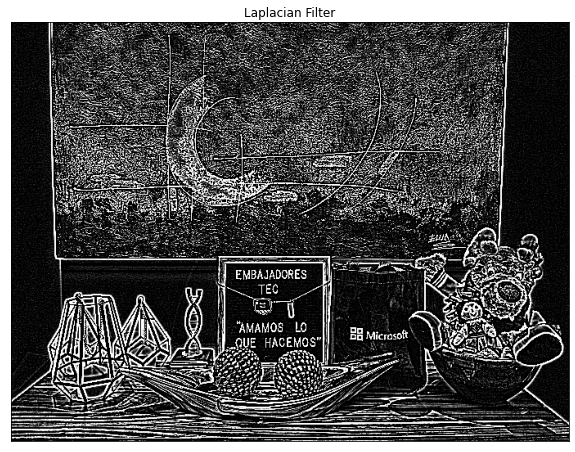

In [234]:
img_filtered = cv2.filter2D(src=img_gray, ddepth=-1, kernel=kernel, delta=0)
plt.figure(figsize=(10,10))
plt.title("Laplacian Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("Laplacian Image.png", img_filtered, cmap='gray')

### Laplacian of Gaussian Filter (Mexican Hat Filter)

In [235]:
kernel = np.array([[0, 0, -1, 0, 0],
                   [0, -1, -2, -1, 0],
                   [-1, -2, 16, -2, -1],
                   [0, -1, -2, -1, 0],
                   [0, 0, -1, 0, 0]])

print(kernel)

[[ 0  0 -1  0  0]
 [ 0 -1 -2 -1  0]
 [-1 -2 16 -2 -1]
 [ 0 -1 -2 -1  0]
 [ 0  0 -1  0  0]]


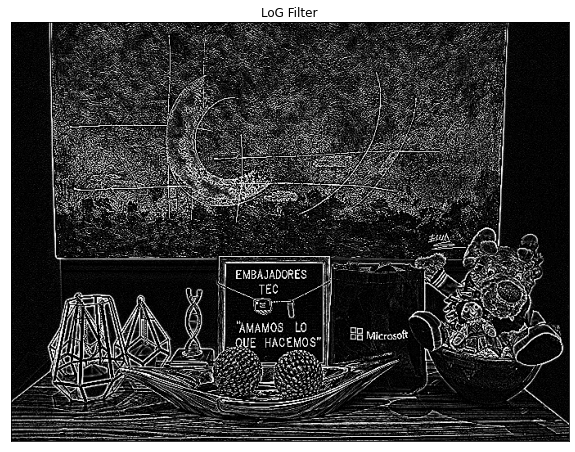

In [236]:
img_filtered = cv2.filter2D(src=img_gray, ddepth=-1, kernel=kernel, delta=0)
plt.figure(figsize=(10,10))
plt.title("LoG Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("LoG Image.png", img_filtered, cmap='gray')

### Edge Detector

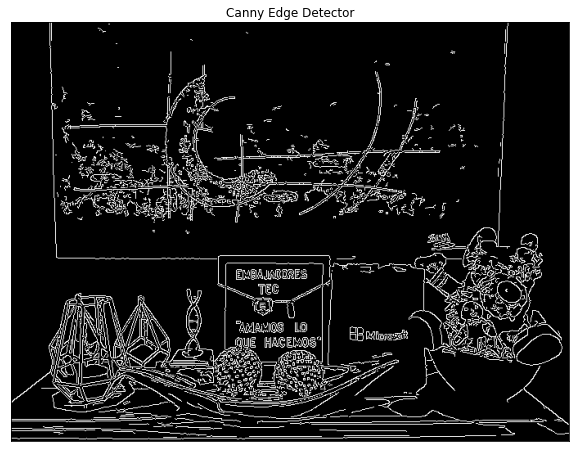

In [237]:
img_canny = cv2.Canny(img_gray, 100, 200)

plt.figure(figsize=(10,10))
plt.title("Canny Edge Detector")
plt.xticks([]), plt.yticks([])
plt.imshow(img_canny, cmap='gray')
plt.imsave("Canny Edge Detector Image.png", img_canny, cmap='gray')

### Enhancement Filter

In [238]:
kernel = np.array([[-1, -1, -1, -1, -1],
                   [-1, -1, -1, -1, -1],
                   [-1, -1, 25, -1, -1],
                   [-1, -1, -1, -1, -1],
                   [-1, -1, -1, -1, -1]])

print(kernel)

[[-1 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1]
 [-1 -1 25 -1 -1]
 [-1 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1]]


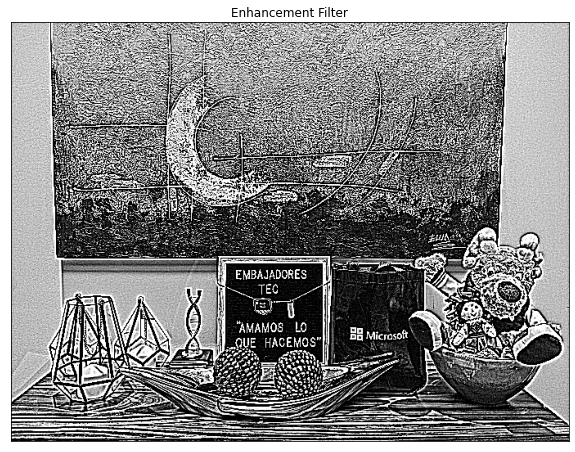

In [239]:
img_filtered = cv2.filter2D(src=img_gray, ddepth=-1, kernel=kernel, delta=0)
plt.figure(figsize=(10,10))
plt.title("Enhancement Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("Enhancement Image.png", img_filtered, cmap='gray')

## Derivatives Gradients

### Sobel X Filter

In [240]:
kernel = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])

print(kernel)

[[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]


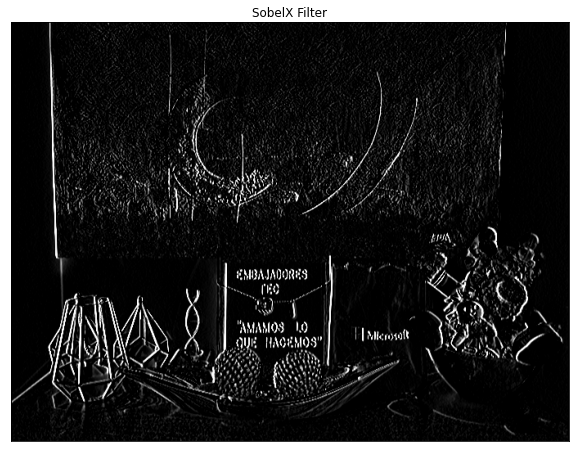

In [241]:
img_filtered = img_sobelX = cv2.filter2D(src=img_gray, ddepth=-1, kernel=kernel, delta=0)

plt.figure(figsize=(10,10))
plt.title("SobelX Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("SobelX Image.png", img_filtered, cmap='gray')

### Sobel Y Filter

In [242]:
kernel = np.array([[1, 2, 1],
                   [0, 0, 0],
                   [-1, -2, -1]])

print(kernel)

[[ 1  2  1]
 [ 0  0  0]
 [-1 -2 -1]]


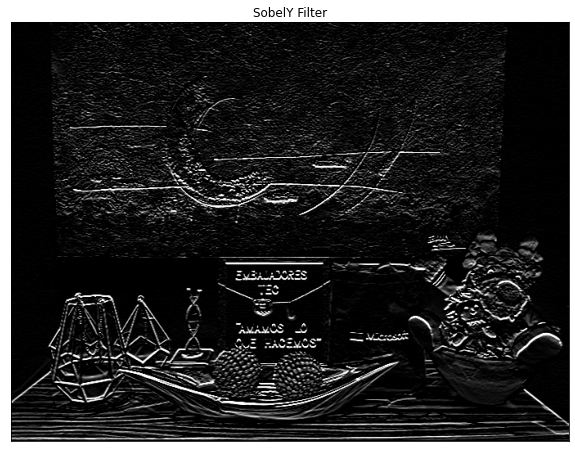

In [243]:
img_filtered = img_sobelY = cv2.filter2D(src=img_gray, ddepth=-1, kernel=kernel, delta=0)

plt.figure(figsize=(10,10))
plt.title("SobelY Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_filtered, cmap='gray')
plt.imsave("SobelY Image.png", img_filtered, cmap='gray')

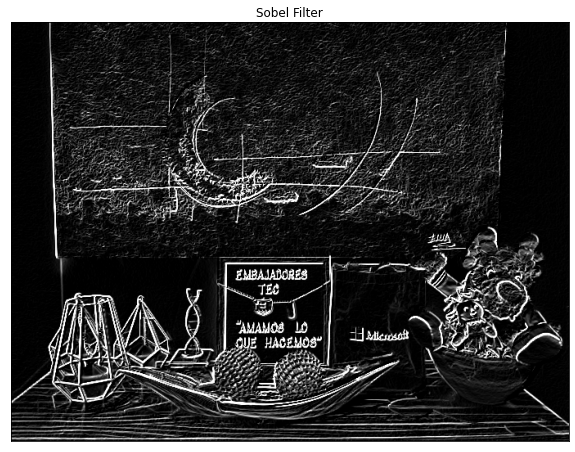

In [249]:
img_sobel = cv2.bitwise_or(img_sobelX, img_sobelY)

plt.figure(figsize=(10,10))
plt.title("Sobel Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_sobel, cmap='gray')
plt.imsave("Sobel Image.png", img_sobel, cmap='gray')

## Morphological Transformations

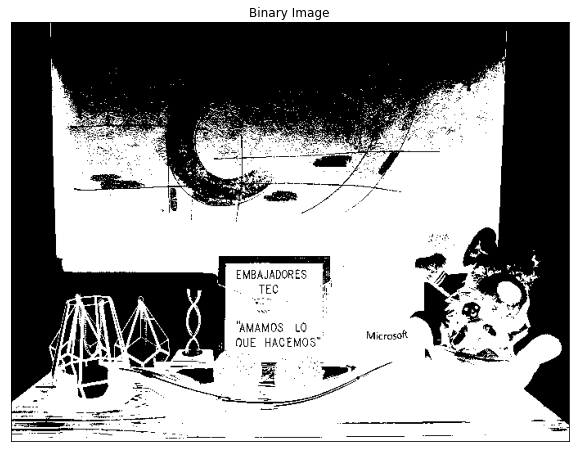

In [245]:
_, img_binary = cv2.threshold(img_gray, 128, 255, cv2.THRESH_BINARY_INV)

plt.figure(figsize=(10,10))
plt.title("Binary Image")
plt.xticks([]), plt.yticks([])
plt.imshow(img_binary, cmap='gray')
plt.imsave("Binary Image.png", img_binary, cmap='gray')

### Dilation

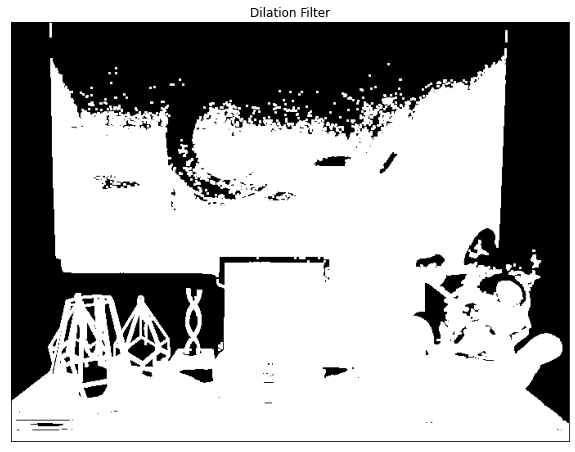

In [246]:
kernel = np.ones((3, 3), np.uint8)

img_dilated = cv2.dilate(img_binary, kernel)

plt.figure(figsize=(10,10))
plt.title("Dilation Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_dilated, cmap='gray')
plt.imsave("Dilation Image.png", img_dilated, cmap='gray')

### Erosion

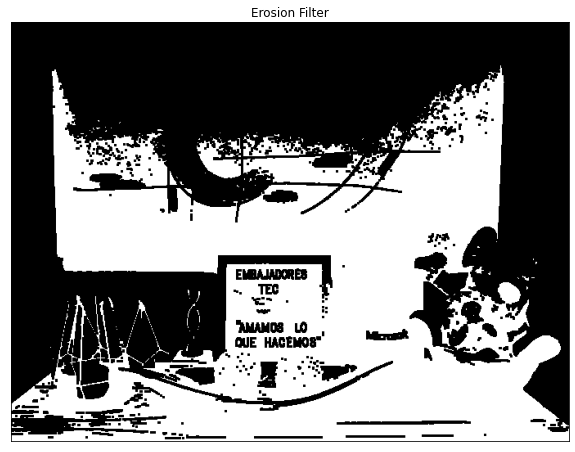

In [248]:
kernel = np.ones((3, 3), np.uint8)

img_eroded = cv2.erode(img_binary, kernel)

plt.figure(figsize=(10,10))
plt.title("Erosion Filter")
plt.xticks([]), plt.yticks([])
plt.imshow(img_eroded, cmap='gray')
plt.imsave("Erosion Image.png", img_eroded, cmap='gray')